In [1]:
using Championetal2023, Plots, StatsBase, SparseArrays, Statistics

┌ Warning: Package Championetal2022 does not have SparseArrays in its dependencies:
│ - If you have Championetal2022 checked out for development and have
│   added SparseArrays as a dependency but haven't updated your primary
│   environment's manifest file, try `Pkg.resolve()`.
│ - Otherwise you may need to report an issue with Championetal2022
└ Loading SparseArrays into Championetal2022 from project dependency, future warnings for Championetal2022 are suppressed.


# Figure 2B

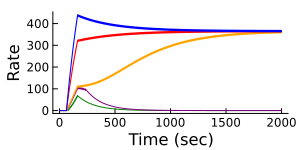

In [22]:
starts = 100 
stops = starts .+ 100
durations = 100

inputs = [0.52, 0.65, 0.7, 5.0, 10.0]

thisdict = Dict([
        ("g_Na", 35.0), #mS/cm2
        ("g_K", 9.0), #mS/cm2
        ("g_L", 0.5), #mS/cm2
        ("E_Na", 55.0), #mV
        ("phi", 15.0),
        ("E_K", -90.0), #mV
        ("C_m", 0.333), #μF/cm2
        ("E_L", -65.0), #mV
        ("tau_syn", 150.0), #ms
        ("w_EE", 1.0), #mV
        ("spike_threshold", 0.0), # mV
        ("nnodes", 1), #number of network nodes
        ("simtype", :alltoall), #type of simulation

        ("noisesigma", 0.0), 
        ("tau_n", 40), 
        ("gammasigma", 0.0), 
        ("tau_n_gamma", 500), 
        ("omegasigma", 0.0), 
        ("tau_n_omega", 500), 

        ("gamma_I_t", 0.0), #uA/cm2
        ("omega_I_t", 0.05),  #1/ms
        ("g_syn", 5.5), #mS/cm2
        ("I_O", 3.515),  #uA/cm2 

        ("pulseheights", inputs), #uA/cm2
        ("pulsestarts", starts), # ms
        ("pulsedurations", durations), # ms

        ("dt", 0.01),
        ("tmax", 2000),
        ("downsamplespacing", 10),
        ]
)

oscplot_tseries = plot(grid=false, xlabel="Time (sec)", ylabel="Rate", size = (300, 150))
colorvect = [:green, :purple, :orange, :red, :blue]


storage = zeros(convert(Int64, round(length(0:thisdict["dt"]:thisdict["tmax"])/thisdict["downsamplespacing"])), length(inputs)+1)
for (idx, input) in enumerate(inputs)
    thisdict["pulseheights"] = input
    tvals, sim = oscintegrator_sim(thisdict)

    plot!(oscplot_tseries, tvals.plot_t_vect, sim.s_vect*1000, legend=false, color=colorvect[idx])

    storage[:,1] = tvals.plot_t_vect/1000
    storage[:,idx+1] = sim.s_vect*1000

end

plot(oscplot_tseries)

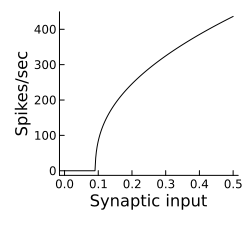

In [2]:
allstrengths_synval = range(0, stop=0.5, length=250)

thisdict = Dict([
        ("g_Na", 35.0), #mS/cm2
        ("g_K", 9.0), #mS/cm2
        ("g_L", 0.5), #mS/cm2
        ("E_Na", 55.0), #mV
        ("phi", 15.0),
        ("E_K", -90.0), #mV
        ("C_m", 0.333), #μF/cm2
        ("E_L", -65.0), #mV
        ("tau_syn", 150.0), #ms
        ("w_EE", 1.0), #mV
        ("spike_threshold", 0.0), # mV
        ("nnodes", 1), #number of network nodes
        ("simtype", :alltoall), #type of simulation

        ("noisesigma", 0.0),
        ("tau_n", 5), #ms

        ("gamma_I_t", 0.0), #uA/cm2
        ("omega_I_t", 0.05), #  #1/ms
        ("g_syn", 5.5), #mS/cm2
        ("I_O", 3.515), 

        ("dt", 0.01),
        ("tmax", 4000),
        ("downsamplespacing", 10),
        ])


myedges = getedges(thisdict["omega_I_t"], thisdict["tmax"])
allstrengths = allstrengths_synval
ratestorage = zeros(length(allstrengths))
for (i, synapsestrength) in enumerate(allstrengths)
    thisdict["I_syn"] = synapsestrength
    tvals, sim = oscintegrator_stdystate(thisdict)

    tempspikes = nonzeros(sim.spikes_vect)

    midpoint = round(Int64, length(tempspikes)/2)

    if length(tempspikes)>0
        spikestatstorage = (length(tempspikes) - midpoint)/(tempspikes[end]/1000 - tempspikes[midpoint]/1000)
    else
        spikestatstorage = 0
    end

    ratestorage[i] = spikestatstorage

end

bifplot = plot(xlabel="Synaptic input", ylabel="Spikes/sec",grid=false, legend=false, size = (250,225))
plot!(bifplot, allstrengths_synval, ratestorage, color=:black)
plot(bifplot)

# Figure 2D

  0.839743 seconds (34.66 M allocations: 532.521 MiB, 8.62% gc time)
  1.093845 seconds (34.66 M allocations: 532.524 MiB, 6.82% gc time)
  0.809443 seconds (34.66 M allocations: 532.525 MiB, 6.87% gc time)
  0.829863 seconds (34.66 M allocations: 532.525 MiB, 7.96% gc time)
  0.818931 seconds (34.66 M allocations: 532.526 MiB, 7.05% gc time)


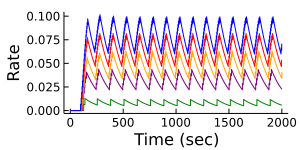

In [4]:
inputs = [0.05, 0.2, 0.3, 0.45, 0.6] 

thisdict = Dict([
        ("g_Na", 35.0), #mS/cm2
        ("g_K", 9.0), #mS/cm2
        ("g_L", 0.5), #mS/cm2
        ("E_Na", 55.0), #mV
        ("phi", 15.0),
        ("E_K", -90.0), #mV
        ("C_m", 0.333), #μF/cm2
        ("E_L", -65.0), #mV
        ("tau_syn", 150.0), #ms
        ("w_EE", 1.0), #mV
        ("spike_threshold", 0.0), # mV
        ("nnodes", 1), #number of network nodes
        ("simtype", :alltoall), #type of simulation

        ("noisesigma", 0.0), 
        ("tau_n", 40), 
        ("gammasigma", 0.0), 
        ("tau_n_gamma", 500), 
        ("omegasigma", 0.0), 
        ("tau_n_omega", 500), 

        ("gamma_I_t", 0.5), #uA/cm2
        ("omega_I_t", 0.05),  #1/ms
        ("g_syn", 5.5), #mS/cm2
        ("I_O", 3.515),  #uA/cm2 

        ("pulseheights", inputs), #uA/cm2
        ("pulsestarts", starts), # ms
        ("pulsedurations", durations), # ms

        ("dt", 0.01),
        ("tmax", 2000),
        ("downsamplespacing", 10),
        ]
)

oscplot_tseries = plot(grid=false, xlabel="Time (sec)", ylabel="Rate", size = (300, 150))
colorvect = [:green, :purple, :orange, :red, :blue]


storage = zeros(convert(Int64, round(length(0:thisdict["dt"]:thisdict["tmax"])/thisdict["downsamplespacing"])), length(inputs)+1)
for (idx, input) in enumerate(inputs)
    thisdict["pulseheights"] = input
    @time tvals, sim = oscintegrator_sim(thisdict)

    plot!(oscplot_tseries, tvals.plot_t_vect, sim.s_vect, legend=false, color=colorvect[idx])

    storage[:,1] = tvals.plot_t_vect/1000
    storage[:,idx+1] = sim.s_vect*1000

end

plot(oscplot_tseries)

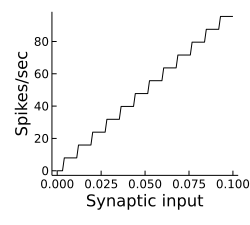

In [5]:
using StatsBase, SparseArrays, Statistics


allstrengths_synval = range(0, stop=0.1, length=100)

thisdict = Dict([
        ("g_Na", 35.0), #mS/cm2
        ("g_K", 9.0), #mS/cm2
        ("g_L", 0.5), #mS/cm2
        ("E_Na", 55.0), #mV
        ("phi", 15.0),
        ("E_K", -90.0), #mV
        ("C_m", 0.333), #μF/cm2
        ("E_L", -65.0), #mV
        ("tau_syn", 150.0), #ms
        ("w_EE", 1.0), #mV
        ("spike_threshold", 0.0), # mV
        ("nnodes", 1), #number of network nodes
        ("simtype", :alltoall), #type of simulation

        ("noisesigma", 0.0),
        ("tau_n", 5), #ms

        ("gamma_I_t", -0.5), #uA/cm2
        ("omega_I_t", 0.05), #  #1/ms
        ("g_syn", 5.5), #mS/cm2
        ("I_O", 3.515),

        ("dt", 0.01),
        ("tmax", 4000),
        ("downsamplespacing", 10),
        ])


myedges = getedges(thisdict["omega_I_t"], thisdict["tmax"])
allstrengths = allstrengths_synval
ratestorage = zeros(length(allstrengths))
for (i, synapsestrength) in enumerate(allstrengths)
    thisdict["I_syn"] = synapsestrength
    tvals, sim = oscintegrator_stdystate(thisdict)

    tempspikes = nonzeros(sim.spikes_vect)

    midpoint = round(Int64, length(tempspikes)/2)

    if length(tempspikes)>0
        spikestatstorage = (length(tempspikes) - midpoint)/(tempspikes[end]/1000 - tempspikes[midpoint]/1000)
    else
        spikestatstorage = 0
    end

    ratestorage[i] = spikestatstorage

end

bifplot = plot(xlabel="Synaptic input", ylabel="Spikes/sec",grid=false, legend=false, size = (250,225))
plot!(bifplot, allstrengths_synval, ratestorage, color=:black)
plot(bifplot)

  0.797408 seconds (34.66 M allocations: 532.520 MiB, 4.46% gc time)
  1.042716 seconds (34.66 M allocations: 532.524 MiB, 3.29% gc time)
  0.787498 seconds (34.66 M allocations: 532.524 MiB, 4.47% gc time)
  0.796121 seconds (34.66 M allocations: 532.525 MiB, 4.53% gc time)
  0.786305 seconds (34.66 M allocations: 532.526 MiB, 4.55% gc time)


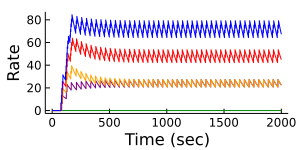

In [7]:
inputs = [0.05, 0.2, 0.3, 0.45, 0.6] 

thisdict = Dict([
        ("g_Na", 35.0), #mS/cm2
        ("g_K", 9.0), #mS/cm2
        ("g_L", 0.5), #mS/cm2
        ("E_Na", 55.0), #mV
        ("phi", 15.0),
        ("E_K", -90.0), #mV
        ("C_m", 0.333), #μF/cm2
        ("E_L", -65.0), #mV
        ("tau_syn", 150.0), #ms
        ("w_EE", 1.0), #mV
        ("spike_threshold", 0.0), # mV
        ("nnodes", 1), #number of network nodes
        ("simtype", :alltoall), #type of simulation

        ("noisesigma", 0.0), 
        ("tau_n", 40), 
        ("gammasigma", 0.0), 
        ("tau_n_gamma", 500), 
        ("omegasigma", 0.0), 
        ("tau_n_omega", 500), 

        ("gamma_I_t", 0.5), #uA/cm2
        ("omega_I_t", 0.15),  #1/ms
        ("g_syn", 5.5), #mS/cm2
        ("I_O", 3.515),  #uA/cm2 

        ("pulseheights", inputs), #uA/cm2
        ("pulsestarts", starts), # ms
        ("pulsedurations", durations), # ms

        ("dt", 0.01),
        ("tmax", 2000),
        ("downsamplespacing", 10),
        ]
)

oscplot_tseries = plot(grid=false, xlabel="Time (sec)", ylabel="Rate", size = (300, 150))
colorvect = [:green, :purple, :orange, :red, :blue]


storage = zeros(convert(Int64, round(length(0:thisdict["dt"]:thisdict["tmax"])/thisdict["downsamplespacing"])), length(inputs)+1)
for (idx, input) in enumerate(inputs)
    thisdict["pulseheights"] = input
    @time tvals, sim = oscintegrator_sim(thisdict)

    plot!(oscplot_tseries, tvals.plot_t_vect, sim.s_vect*1000, legend=false, color=colorvect[idx])

    storage[:,1] = tvals.plot_t_vect/1000
    storage[:,idx+1] = sim.s_vect*1000

end

plot(oscplot_tseries)

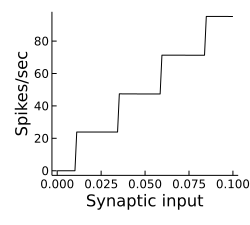

In [8]:
using StatsBase, SparseArrays, Statistics


allstrengths_synval = range(0, stop=0.1, length=100)

thisdict = Dict([
        ("g_Na", 35.0), #mS/cm2
        ("g_K", 9.0), #mS/cm2
        ("g_L", 0.5), #mS/cm2
        ("E_Na", 55.0), #mV
        ("phi", 15.0),
        ("E_K", -90.0), #mV
        ("C_m", 0.333), #μF/cm2
        ("E_L", -65.0), #mV
        ("tau_syn", 150.0), #ms
        ("w_EE", 1.0), #mV
        ("spike_threshold", 0.0), # mV
        ("nnodes", 1), #number of network nodes
        ("simtype", :alltoall), #type of simulation

        ("noisesigma", 0.0),
        ("tau_n", 5), #ms

        ("gamma_I_t", -0.5), #uA/cm2
        ("omega_I_t", 0.15), #1/ms
        ("g_syn", 5.5), #mS/cm2
        ("I_O", 3.515), 

        ("dt", 0.01),
        ("tmax", 4000),
        ("downsamplespacing", 10),
        ])


myedges = getedges(thisdict["omega_I_t"], thisdict["tmax"])
allstrengths = allstrengths_synval 
ratestorage = zeros(length(allstrengths))
for (i, synapsestrength) in enumerate(allstrengths)
    thisdict["I_syn"] = synapsestrength
    tvals, sim = oscintegrator_stdystate(thisdict)

    tempspikes = nonzeros(sim.spikes_vect)

    midpoint = round(Int64, length(tempspikes)/2)

    if length(tempspikes)>0
        spikestatstorage = (length(tempspikes) - midpoint)/(tempspikes[end]/1000 - tempspikes[midpoint]/1000)
    else
        spikestatstorage = 0
    end

    ratestorage[i] = spikestatstorage

end

bifplot = plot(xlabel="Synaptic input", ylabel="Spikes/sec",grid=false, legend=false, size = (250,225))
plot!(bifplot, allstrengths_synval, ratestorage, color=:black)

  0.898689 seconds (34.66 M allocations: 532.520 MiB, 7.31% gc time)
  0.983879 seconds (34.66 M allocations: 532.525 MiB, 7.07% gc time)
  0.823654 seconds (34.66 M allocations: 532.525 MiB, 6.64% gc time)
  0.853862 seconds (34.66 M allocations: 532.525 MiB, 7.31% gc time)
  0.859711 seconds (34.66 M allocations: 532.526 MiB, 7.29% gc time)


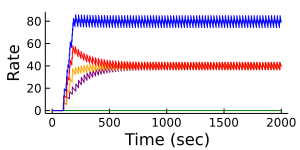

In [9]:
inputs = [0.05, 0.2, 0.3, 0.45, 0.6] 

thisdict = Dict([
        ("g_Na", 35.0), #mS/cm2
        ("g_K", 9.0), #mS/cm2
        ("g_L", 0.5), #mS/cm2
        ("E_Na", 55.0), #mV
        ("phi", 15.0),
        ("E_K", -90.0), #mV
        ("C_m", 0.333), #μF/cm2
        ("E_L", -65.0), #mV
        ("tau_syn", 150.0), #ms
        ("w_EE", 1.0), #mV
        ("spike_threshold", 0.0), # mV
        ("nnodes", 1), #number of network nodes
        ("simtype", :alltoall), #type of simulation

        ("noisesigma", 0.0), 
        ("tau_n", 40), 
        ("gammasigma", 0.0), 
        ("tau_n_gamma", 500), 
        ("omegasigma", 0.0), 
        ("tau_n_omega", 500), 

        ("gamma_I_t", 0.5), #uA/cm2
        ("omega_I_t", 0.25),  #1/ms
        ("g_syn", 5.5), #mS/cm2
        ("I_O", 3.515),  #uA/cm2 

        ("pulseheights", inputs), #uA/cm2
        ("pulsestarts", starts), # ms
        ("pulsedurations", durations), # ms

        ("dt", 0.01),
        ("tmax", 2000),
        ("downsamplespacing", 10),
        ]
)

oscplot_tseries = plot(grid=false, xlabel="Time (sec)", ylabel="Rate", size = (300, 150))
colorvect = [:green, :purple, :orange, :red, :blue]


storage = zeros(convert(Int64, round(length(0:thisdict["dt"]:thisdict["tmax"])/thisdict["downsamplespacing"])), length(inputs)+1)
for (idx, input) in enumerate(inputs)
    thisdict["pulseheights"] = input
    @time tvals, sim = oscintegrator_sim(thisdict)

    plot!(oscplot_tseries, tvals.plot_t_vect, sim.s_vect*1000, legend=false, color=colorvect[idx])

    storage[:,1] = tvals.plot_t_vect/1000
    storage[:,idx+1] = sim.s_vect*1000

end

plot(oscplot_tseries)

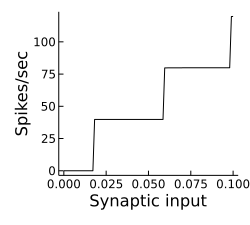

In [10]:
using StatsBase, SparseArrays, Statistics


allstrengths_synval = range(0, stop=0.1, length=100)

thisdict = Dict([
        ("g_Na", 35.0), #mS/cm2
        ("g_K", 9.0), #mS/cm2
        ("g_L", 0.5), #mS/cm2
        ("E_Na", 55.0), #mV
        ("phi", 15.0),
        ("E_K", -90.0), #mV
        ("C_m", 0.333), #μF/cm2
        ("E_L", -65.0), #mV
        ("tau_syn", 150.0), #ms
        ("w_EE", 1.0), #mV
        ("spike_threshold", 0.0), # mV
        ("nnodes", 1), #number of network nodes
        ("simtype", :alltoall), #type of simulation

        ("gamma_I_t", -0.5), #uA/cm2
        ("omega_I_t", 0.25), #  #1/ms
        ("g_syn", 5.5), #mS/cm2
        ("I_O", 3.515),

        ("dt", 0.01),
        ("tmax", 4000),
        ("downsamplespacing", 10),
        ])


myedges = getedges(thisdict["omega_I_t"], thisdict["tmax"])
allstrengths = allstrengths_synval
ratestorage = zeros(length(allstrengths))
for (i, synapsestrength) in enumerate(allstrengths)
    thisdict["I_syn"] = synapsestrength
    tvals, sim = oscintegrator_stdystate(thisdict)

    tempspikes = nonzeros(sim.spikes_vect)

    midpoint = round(Int64, length(tempspikes)/2)

    if length(tempspikes)>0
        spikestatstorage = (length(tempspikes) - midpoint)/(tempspikes[end]/1000 - tempspikes[midpoint]/1000)
    else
        spikestatstorage = 0
    end

    ratestorage[i] = spikestatstorage

end

bifplot = plot(xlabel="Synaptic input", ylabel="Spikes/sec",grid=false, legend=false, size = (250,225))
plot!(bifplot, allstrengths_synval, ratestorage, color=:black)